<a href="https://colab.research.google.com/github/Skand576/geture-detection/blob/main/gesture_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip uninstall -y mediapipe
!pip install mediapipe==0.10.21



Found existing installation: mediapipe 0.10.21
Uninstalling mediapipe-0.10.21:
  Successfully uninstalled mediapipe-0.10.21
  Using cached mediapipe-0.10.21-cp312-cp312-manylinux_2_28_x86_64.whl.metadata (9.7 kB)
Using cached mediapipe-0.10.21-cp312-cp312-manylinux_2_28_x86_64.whl (35.6 MB)


In [3]:
import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow

mp_hands = mp.solutions.hands
mp_draw = mp.solutions.drawing_utils
hands = mp_hands.Hands()

cap = cv2.VideoCapture("input.mp4")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = hands.process(rgb)

    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            mp_draw.draw_landmarks(
                frame, hand_landmarks, mp_hands.HAND_CONNECTIONS
            )

    cv2_imshow(frame)


<IPython.core.display.Javascript object>

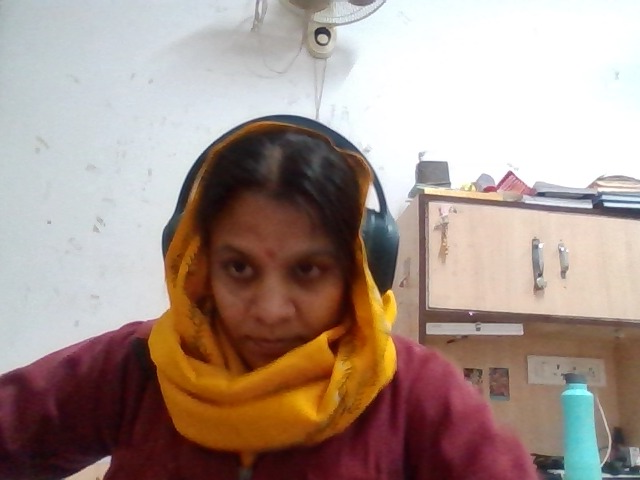

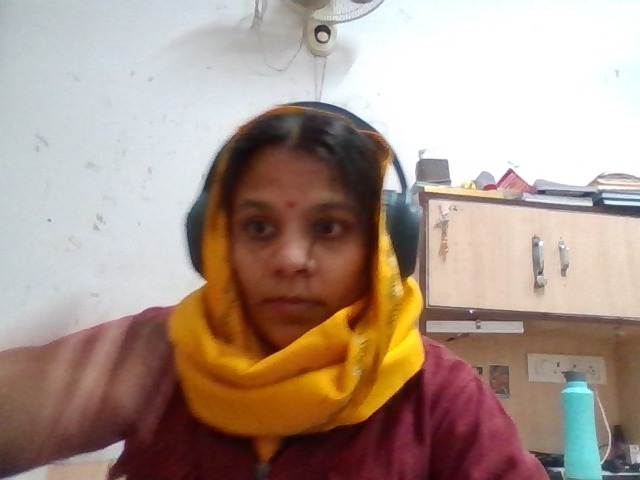

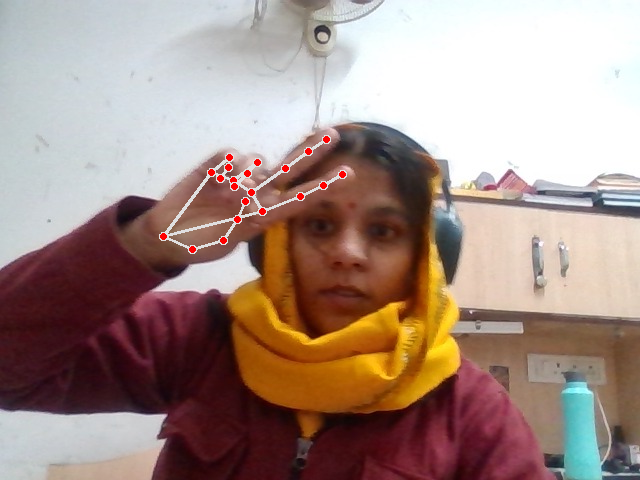

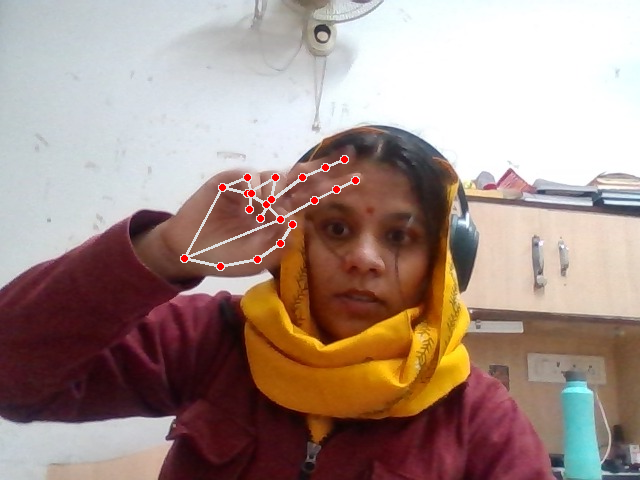

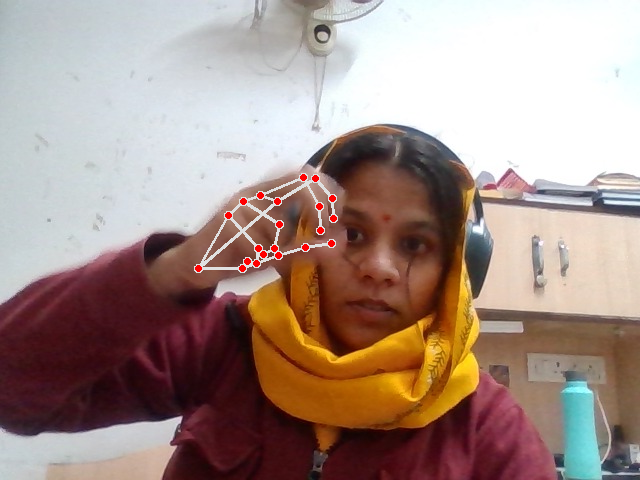

...

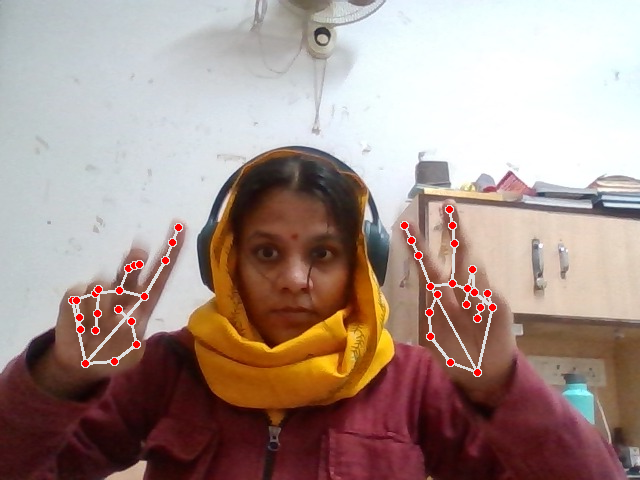

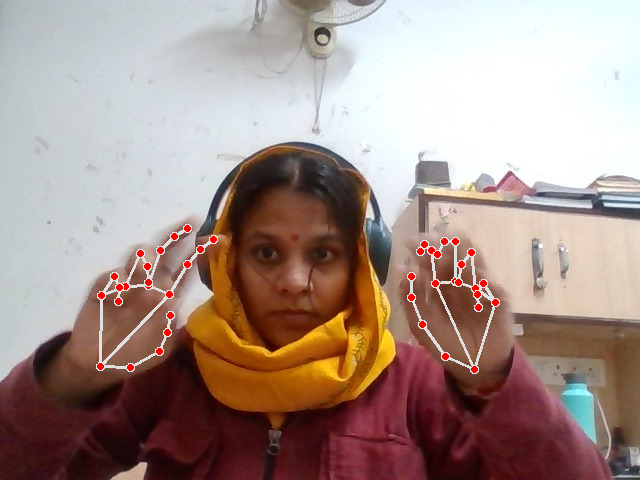

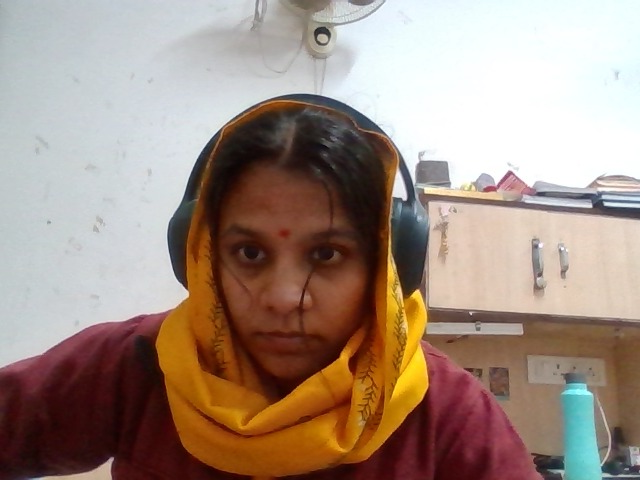

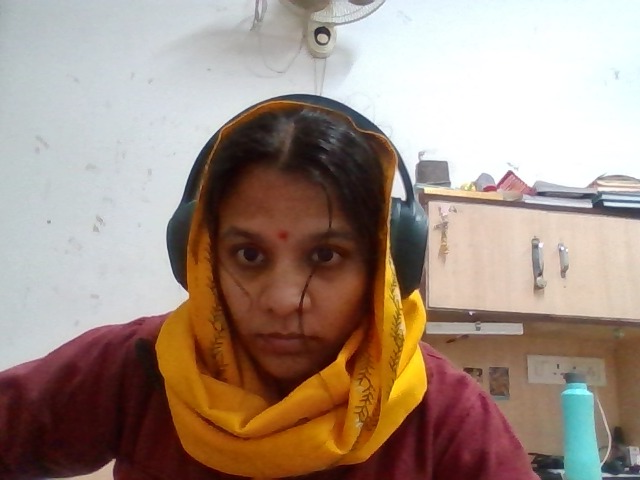

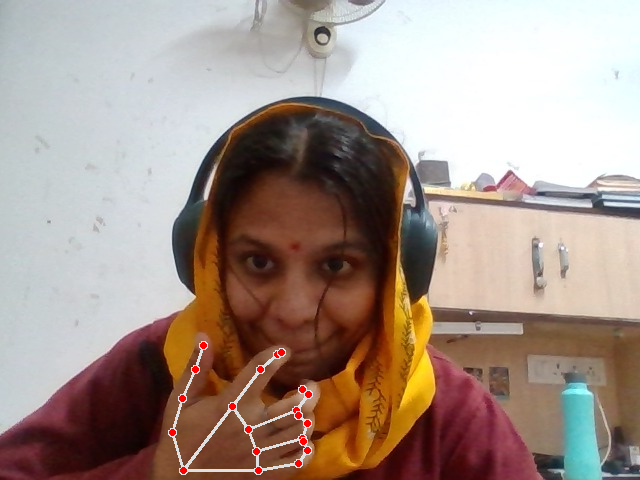

In [5]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
import numpy as np
import cv2
import base64
from google.colab.patches import cv2_imshow

# Re-define the Javascript functions and get_frame to ensure they are available
display(Javascript("""
window.stream = null;
window.video = null;

async function startCamera(){
  if (window.stream !== null) return;

  window.video = document.createElement('video');
  window.video.style.display = 'none';
  document.body.appendChild(window.video);

  window.stream = await navigator.mediaDevices.getUserMedia({video:true});
  window.video.srcObject = window.stream;
  await window.video.play();
}

async function captureFrame(){
  await startCamera();

  const canvas = document.createElement('canvas');
  canvas.width = window.video.videoWidth;
  canvas.height = window.video.videoHeight;
  const ctx = canvas.getContext('2d');
  ctx.drawImage(window.video, 0, 0);

  return canvas.toDataURL('image/jpeg');
}
"""))

def get_frame():
    data = eval_js("captureFrame()")
    img = base64.b64decode(data.split(',')[1])
    img = np.frombuffer(img, dtype=np.uint8)
    frame = cv2.imdecode(img, cv2.IMREAD_COLOR)
    return frame

for i in range(30):  # capture 30 frames
    frame = get_frame()
    frame = cv2.flip(frame, 1)

    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = hands.process(rgb)

    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            mp_draw.draw_landmarks(
                frame, hand_landmarks, mp_hands.HAND_CONNECTIONS
            )

    cv2_imshow(frame)
